In [3]:
!pip install opencv-python-headless matplotlib numpy ipywidgets

  Using cached ipywidgets-8.1.8-py3-none-any.whl.metadata (2.4 kB)
  Using cached widgetsnbextension-4.0.15-py3-none-any.whl.metadata (1.6 kB)
  Using cached jupyterlab_widgets-3.0.16-py3-none-any.whl.metadata (20 kB)
Using cached ipywidgets-8.1.8-py3-none-any.whl (139 kB)
Using cached jupyterlab_widgets-3.0.16-py3-none-any.whl (914 kB)
Using cached widgetsnbextension-4.0.15-py3-none-any.whl (2.2 MB)

[notice] A new release of pip is available: 24.0 -> 26.2.1
[notice] To update, run: pip install --upgrade pip


In [131]:
from IPython.display import display
import ipywidgets as widgets

uploader = widgets.FileUpload(
    accept='image/*',
    multiple=False
)

display(uploader)



FileUpload(value=(), accept='image/*', description='Upload')

In [132]:
# Get uploaded image
uploaded = uploader.value

if uploaded:
    # ipywidgets versions differ slightly
    if isinstance(uploaded, dict):
        file_info = next(iter(uploaded.values()))
    else:
        file_info = uploaded[0]

    image_bytes = file_info['content']

    print("Loaded:", file_info['name'])

Loaded: Trapezoid_Image002.JPG


Width: 6000
Height: 4000


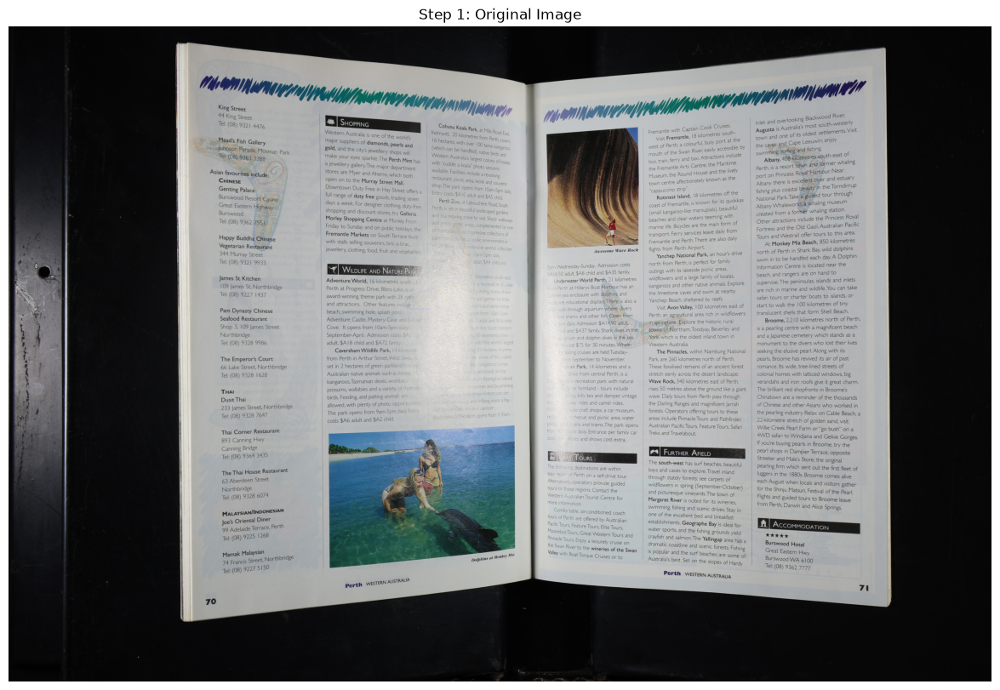

In [133]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imdecode(
    np.frombuffer(image_bytes, np.uint8),
    cv2.IMREAD_COLOR
)

if img is None:
    raise ValueError("Could not load image")

original = img.copy()

h, w = img.shape[:2]

print("Width:", w)
print("Height:", h)

plt.figure(figsize=(16, 10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Step 1: Original Image")
plt.axis("off")
plt.show()


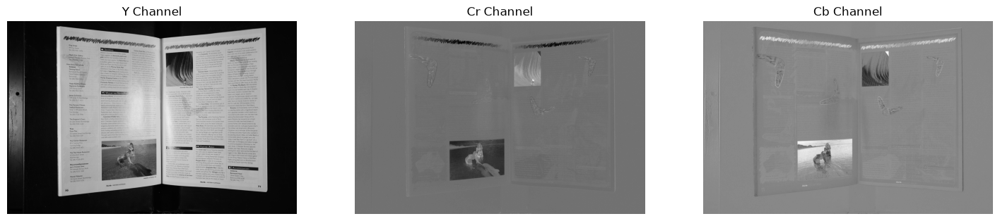

In [134]:
ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)

# Display individual channels
Y, Cr, Cb = cv2.split(ycrcb)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(Y, cmap="gray")
plt.title("Y Channel")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(Cr, cmap="gray")
plt.title("Cr Channel")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(Cb, cmap="gray")
plt.title("Cb Channel")
plt.axis("off")

plt.show()

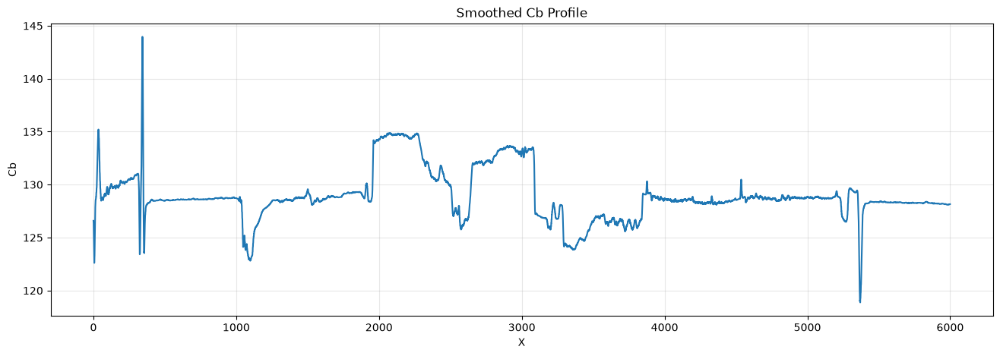

In [135]:
# Average Cb vertically, avoiding the fingers and bottom edge
cb_profile = np.mean(
    Cb[int(h * 0.25):int(h * 0.80)],
    axis=0
)

# Smooth out text/detail noise
cb_profile = cv2.GaussianBlur(
    cb_profile.reshape(1, -1).astype(np.float32),
    (1, 81),
    0
).ravel()

plt.figure(figsize=(16, 5))
plt.plot(cb_profile)
plt.title("Smoothed Cb Profile")
plt.xlabel("X")
plt.ylabel("Cb")
plt.grid(alpha=0.3)
plt.show()


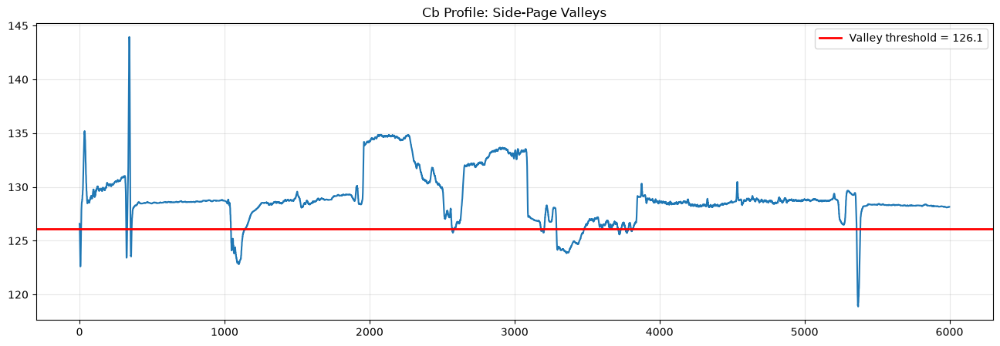

In [136]:
# Find regions where Cb drops significantly below the front-page level

front_level = np.median(
    cb_profile[int(w * 0.35):int(w * 0.65)]
)

valley_threshold = front_level - 3.0

low = (cb_profile < valley_threshold).astype(np.uint8)

plt.figure(figsize=(16, 5))
plt.plot(cb_profile)
plt.axhline(
    valley_threshold,
    color="red",
    linewidth=2,
    label=f"Valley threshold = {valley_threshold:.1f}"
)
plt.title("Cb Profile: Side-Page Valleys")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [137]:
# Cell 3E: Find low-Cb runs

low = cb_profile < valley_threshold

# Find start/end of every True run
padded = np.r_[False, low, False]

starts = np.where(~padded[:-1] & padded[1:])[0]
ends   = np.where(padded[:-1] & ~padded[1:])[0]

regions = [
    (s, e)
    for s, e in zip(starts, ends)
    if e - s > 20
]

print("Low-Cb regions:")

for s, e in regions:
    print(f"{s} -> {e}   width={e-s}")

Low-Cb regions:
1044 -> 1142   width=98
3184 -> 3206   width=22
3290 -> 3481   width=191
5360 -> 5385   width=25


In [138]:
# Cell 3F: Determine side-page removal boundaries

left_valley = max(
    [r for r in regions if r[1] < w // 2],
    key=lambda r: r[1] - r[0]
)

right_valley = max(
    [r for r in regions if r[0] > w // 2],
    key=lambda r: r[1] - r[0]
)

left_cut = left_valley[1]
right_cut = right_valley[0]

print("Left side-page region :", left_valley)
print("Right side-page region:", right_valley)

print("LEFT CUT :", left_cut)
print("RIGHT CUT:", right_cut)

Left side-page region : (np.int64(1044), np.int64(1142))
Right side-page region: (np.int64(3290), np.int64(3481))
LEFT CUT : 1142
RIGHT CUT: 3290


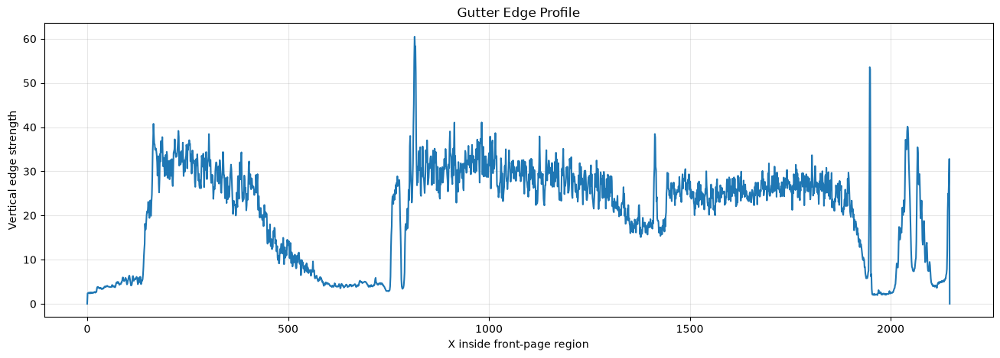

In [139]:
# Cell 3I: Detect actual gutter

# Work only inside the detected front-page region
front_gray = cv2.cvtColor(
    img[:, left_cut:right_cut],
    cv2.COLOR_BGR2GRAY
)

# Vertical edge strength
gx = cv2.Sobel(
    front_gray,
    cv2.CV_32F,
    1,
    0,
    ksize=3
)

gutter_profile = np.mean(
    np.abs(gx),
    axis=0
)

# Smooth the profile
gutter_profile = cv2.GaussianBlur(
    gutter_profile.reshape(1, -1),
    (1, 51),
    0
).ravel()

plt.figure(figsize=(16, 5))
plt.plot(gutter_profile)

plt.title("Gutter Edge Profile")
plt.xlabel("X inside front-page region")
plt.ylabel("Vertical edge strength")
plt.grid(alpha=0.3)

plt.show()

In [140]:
# Cell 3J: Locate strongest gutter candidate

gutter_x = np.argmax(gutter_profile)

# Convert back to original-image coordinates
gutter_x_global = left_cut + gutter_x

print("Gutter X:", gutter_x_global)

Gutter X: 1957


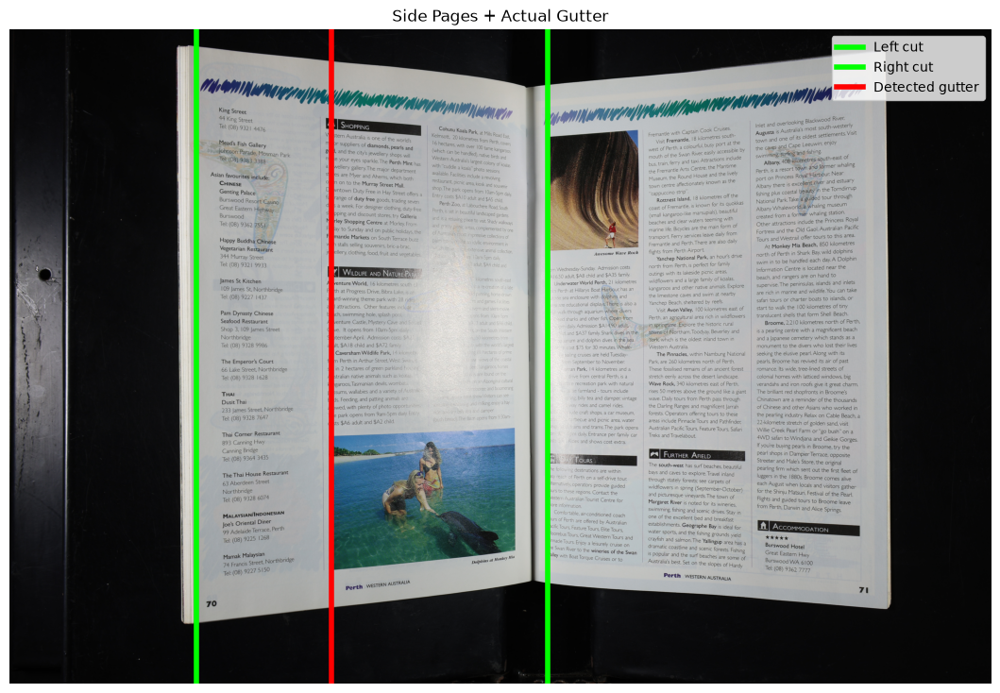

In [145]:
# Cell 3K: Verify actual gutter

vis = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16, 9))
plt.imshow(vis)

plt.axvline(
    left_cut,
    color="lime",
    linewidth=4,
    label="Left cut"
)

plt.axvline(
    right_cut,
    color="lime",
    linewidth=4,
    label="Right cut"
)

plt.axvline(
    gutter_x_global,
    color="red",
    linewidth=4,
    label="Detected gutter"
)

plt.legend()
plt.title("Side Pages + Actual Gutter")
plt.axis("off")
plt.show()

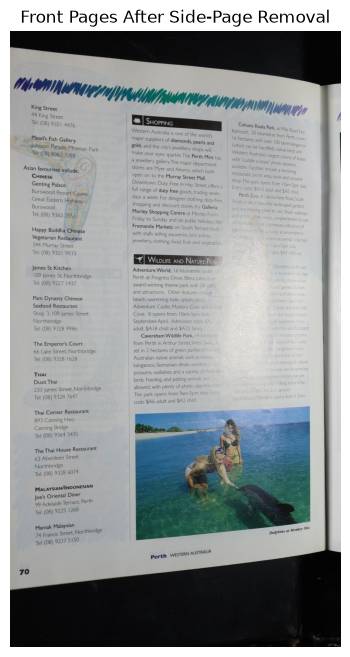

In [142]:
# Cell 3L: Keep only front pages

front_pages = img[:, left_cut:right_cut]

plt.figure(figsize=(14, 8))
plt.imshow(cv2.cvtColor(front_pages, cv2.COLOR_BGR2RGB))
plt.title("Front Pages After Side-Page Removal")
plt.axis("off")
plt.show()


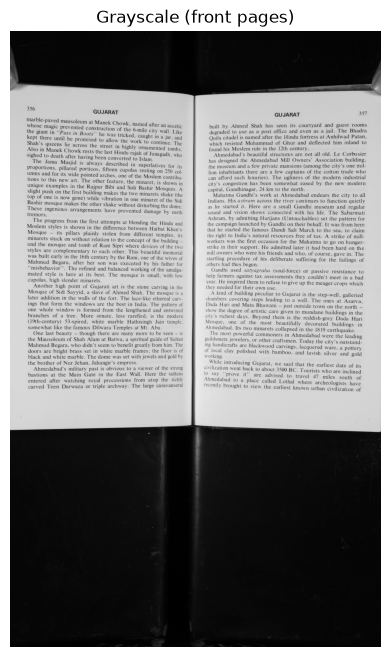

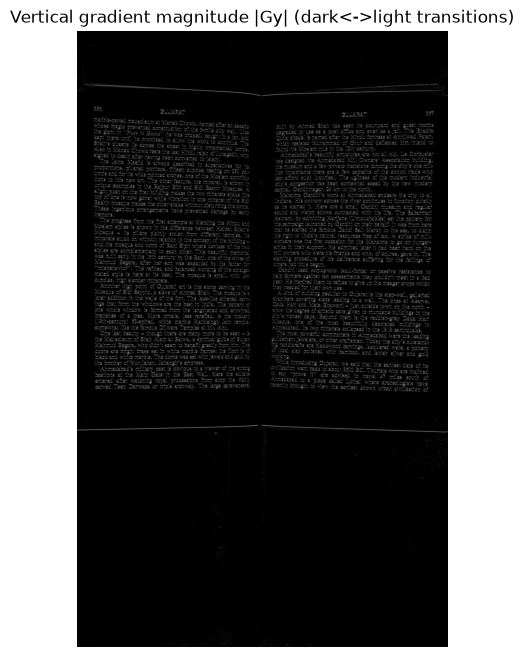

In [102]:
# Cell 4A: Grayscale + vertical gradient of the front-page crop.
# This is the foundation for tracing the top/bottom page edges per column.

gray_fp = cv2.cvtColor(front_pages, cv2.COLOR_BGR2GRAY)
gy_fp = cv2.Sobel(gray_fp, cv2.CV_32F, 0, 1, ksize=3)

Hf, Wf = gray_fp.shape

def find_sustained_transition_row(gray_col, window=80, high_thresh_frac=0.6, from_top=True):
    """General page<->background edge-region finder -- NOT tied to any
    fixed fraction of image height (a hardcoded fraction like Hf*0.35 or
    Hf*0.65 only works on the one photo it was tuned against; confirmed
    broken on a second test photo where the true edges sat at different
    fractions). Works from the column's OWN brightness levels: page level
    is the median of the middle 60% of the column, background level is
    the darkest of the crop's own top/bottom 20px. A short text-line dip
    bounces back within `window` px so the ROLLING MEAN stays above
    threshold; only a REAL edge has brightness drop and stay low for a
    sustained run."""
    n = len(gray_col)
    mid_lo, mid_hi = int(n*0.2), int(n*0.8)
    page_level = np.median(gray_col[mid_lo:mid_hi])
    bg_level = min(gray_col[:20].min(), gray_col[-20:].min())
    threshold = bg_level + (page_level - bg_level) * high_thresh_frac

    kernel = np.ones(window) / window
    rolling = np.convolve(gray_col.astype(np.float64), kernel, mode='same')
    above = rolling > threshold
    idx = np.where(above)[0]
    if len(idx) == 0:
        return 0 if from_top else n - 1
    return idx.min() if from_top else idx.max()

plt.figure(figsize=(14, 8))
plt.imshow(gray_fp, cmap='gray')
plt.title("Grayscale (front pages)")
plt.axis("off")
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(np.abs(gy_fp), cmap='gray')
plt.title("Vertical gradient magnitude |Gy| (dark<->light transitions)")
plt.axis("off")
plt.show()



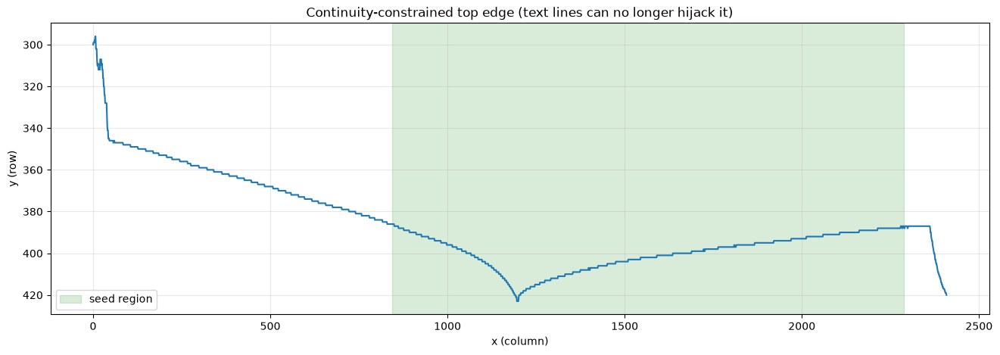

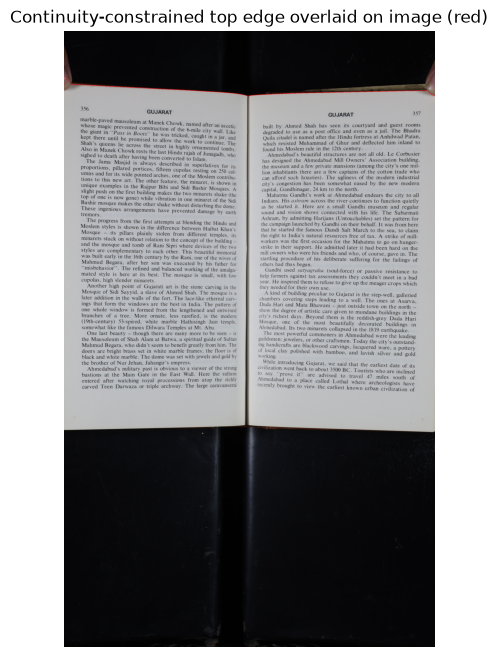

In [103]:
# Cell 4B: Continuity-constrained top-edge trace.
#
# The naive "strongest Gy in the top third" trace (see prior attempt) falls
# into text-line edges across most of the width, not just at the fingers --
# printed text lines are high-contrast dark<->light transitions too, so a
# free per-column argmax has no reason to prefer the true page edge over a
# line of body text lower down. Fingers were never the only problem.
#
# Fix: seed from a column range known to sit on the flat, reliable part of
# the edge (visually confirmed in the previous cell's plot: a stable run
# around x=850-2300). From that seed, walk outward one column at a time,
# each column only allowed to search a small window around the PREVIOUS
# column's accepted row. A text line deep in the page is now unreachable in
# a single column-step, so it can never hijack the trace; a finger sitting
# on the edge shifts the trace smoothly by a few px per column (bridged),
# not a text-line's full-height jump.

seed_lo, seed_hi = int(Wf * 0.35), int(Wf * 0.95)  # inside the flat run
seed_col = (seed_lo + seed_hi) // 2

# search_top: derived from THIS column's own brightness (not a hardcoded
# fraction of Hf -- confirmed broken on a 2nd test photo where the real
# edge sat well outside the old 0.35*Hf assumption). Give it margin beyond
# the detected edge so the seed's own local search window has room.
edge_row_estimate = find_sustained_transition_row(gray_fp[:, seed_col], from_top=True)
search_top = min(Hf, edge_row_estimate + 150)
max_step = 6          # max row change allowed per column step

seed_lo_search = max(0, edge_row_estimate - 100)
seed_row = seed_lo_search + int(np.argmax(gy_fp[seed_lo_search:search_top, seed_col]))

top_edge = np.zeros(Wf, dtype=np.int32)
top_edge[seed_col] = seed_row

# walk right
prev = seed_row
for x in range(seed_col + 1, Wf):
    lo = max(0, prev - max_step)
    hi = min(search_top, prev + max_step + 1)
    window = gy_fp[lo:hi, x]
    prev = lo + int(np.argmax(window))
    top_edge[x] = prev

# walk left
prev = seed_row
for x in range(seed_col - 1, -1, -1):
    lo = max(0, prev - max_step)
    hi = min(search_top, prev + max_step + 1)
    window = gy_fp[lo:hi, x]
    prev = lo + int(np.argmax(window))
    top_edge[x] = prev

plt.figure(figsize=(16, 5))
plt.plot(top_edge)
plt.gca().invert_yaxis()
plt.axvspan(seed_lo, seed_hi, alpha=0.15, color='green', label='seed region')
plt.title("Continuity-constrained top edge (text lines can no longer hijack it)")
plt.xlabel("x (column)")
plt.ylabel("y (row)")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

vis = cv2.cvtColor(front_pages, cv2.COLOR_BGR2RGB).copy()
for x in range(Wf):
    vis[max(0, top_edge[x]-1):top_edge[x]+2, x] = [255, 0, 0]

plt.figure(figsize=(14, 8))
plt.imshow(vis)
plt.title("Continuity-constrained top edge overlaid on image (red)")
plt.axis("off")
plt.show()





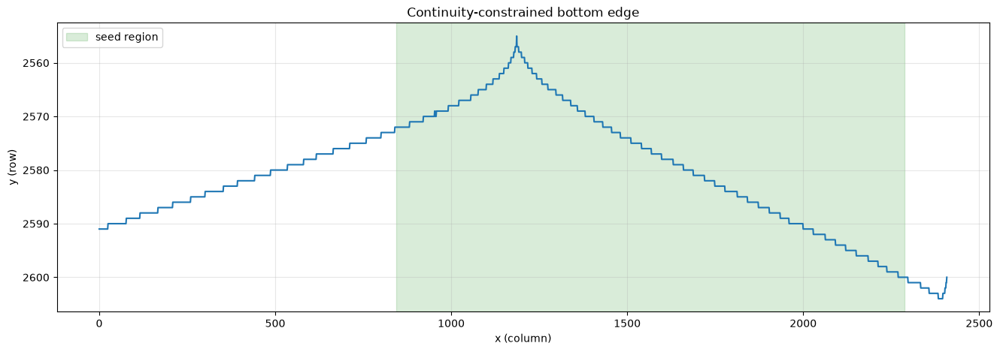

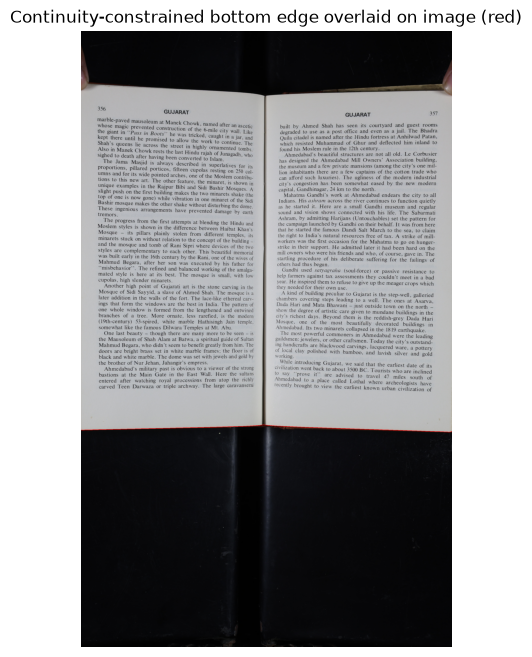

In [104]:
# Cell 4C: Continuity-constrained bottom-edge trace
#
# Mirrors the top-edge tracker:
#   - Find a reliable seed column
#   - Estimate the bottom boundary from that column
#   - Find the strongest local vertical transition
#   - Walk left/right while allowing only small vertical movement
#
# No global curve fitting.
# No hardcoded bottom shape.
# Real boundary curvature is preserved.

# ------------------------------------------------------------
# 1. Seed region
# ------------------------------------------------------------

seed_lo = int(Wf * 0.35)
seed_hi = int(Wf * 0.95)
seed_col = (seed_lo + seed_hi) // 2


# ------------------------------------------------------------
# 2. Estimate bottom boundary at seed column
# ------------------------------------------------------------

edge_row_estimate = find_sustained_transition_row(
    gray_fp[:, seed_col],
    from_top=False
)

# Search a local band around the estimate.
# For the bottom edge, search upward from the estimate as well
# as slightly below it.

search_bot = max(0, edge_row_estimate - 150)
search_bot_hi = min(Hf, edge_row_estimate + 100)


# ------------------------------------------------------------
# 3. Find strongest local vertical transition at seed
# ------------------------------------------------------------

seed_window = np.abs(
    gy_fp[search_bot:search_bot_hi, seed_col]
)

seed_row = (
    search_bot
    + int(np.argmax(seed_window))
)


# ------------------------------------------------------------
# 4. Allocate output
# ------------------------------------------------------------

bottom_edge = np.zeros(Wf, dtype=np.int32)
bottom_edge[seed_col] = seed_row

# Maximum vertical movement allowed between adjacent columns.
# Keeps text/fingers from causing large jumps.
max_step = 6


# ------------------------------------------------------------
# 5. Walk RIGHT
# ------------------------------------------------------------

prev = seed_row

for x in range(seed_col + 1, Wf):

    lo = max(0, prev - max_step)
    hi = min(Hf, prev + max_step + 1)

    window = np.abs(
        gy_fp[lo:hi, x]
    )

    # Strongest vertical transition inside the continuity window
    prev = lo + int(np.argmax(window))

    bottom_edge[x] = prev


# ------------------------------------------------------------
# 6. Walk LEFT
# ------------------------------------------------------------

prev = seed_row

for x in range(seed_col - 1, -1, -1):

    lo = max(0, prev - max_step)
    hi = min(Hf, prev + max_step + 1)

    window = np.abs(
        gy_fp[lo:hi, x]
    )

    # Strongest vertical transition inside the continuity window
    prev = lo + int(np.argmax(window))

    bottom_edge[x] = prev


# ------------------------------------------------------------
# 7. Plot detected bottom boundary
# ------------------------------------------------------------

plt.figure(figsize=(16, 5))

plt.plot(bottom_edge)

plt.gca().invert_yaxis()

plt.axvspan(
    seed_lo,
    seed_hi,
    alpha=0.15,
    color="green",
    label="seed region"
)

plt.title(
    "Continuity-constrained bottom edge"
)

plt.xlabel("x (column)")
plt.ylabel("y (row)")

plt.legend()
plt.grid(alpha=0.3)

plt.show()


# ------------------------------------------------------------
# 8. Overlay on original image
# ------------------------------------------------------------

vis = cv2.cvtColor(
    front_pages,
    cv2.COLOR_BGR2RGB
).copy()

for x in range(Wf):

    y = bottom_edge[x]

    vis[
        max(0, y - 1):min(Hf, y + 2),
        x
    ] = [255, 0, 0]


plt.figure(figsize=(14, 8))

plt.imshow(vis)

plt.title(
    "Continuity-constrained bottom edge overlaid on image (red)"
)

plt.axis("off")

plt.show()


Top edge: bridged 114 / 2409 low-confidence (finger) columns locally


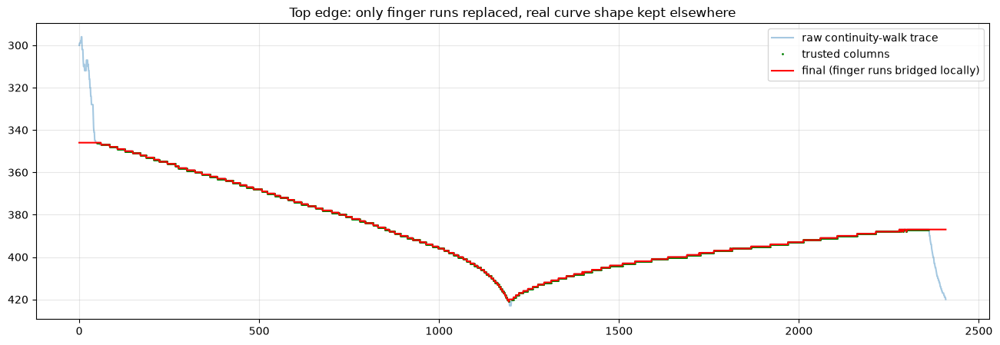

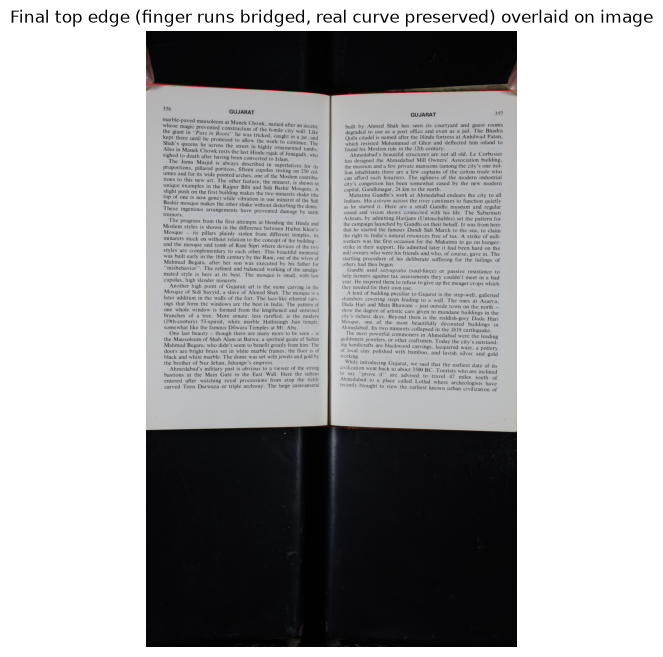

In [105]:
# Cell 4C: Reject finger-covered columns on the TOP edge, then LOCALLY
# gap-fill only across those rejected runs (not a global polynomial --
# that flattened the real gutter V-notch into a straight diagonal, which
# is wrong: the true curve shape must be preserved everywhere except where
# a finger actually breaks the signal).
#
# Score each column's confidence by how strong its accepted Gy peak is
# versus the trace's own median peak strength. A finger breaks the clean
# background->paper contrast, so finger-covered columns show up as
# anomalously weak. For each contiguous run of rejected columns, replace
# ONLY that run with a straight-line interpolation between its two
# trustworthy neighbors (last-good-before, first-good-after) -- everywhere
# else keeps the real traced curve untouched, gutter notch included.

peak_strength = np.array([gy_fp[top_edge[x], x] for x in range(Wf)])
median_strength = np.median(peak_strength)
confidence_threshold = median_strength * 0.4
good = peak_strength > confidence_threshold

top_edge_final = top_edge.copy()

# find contiguous bad runs and bridge each one individually
x = 0
while x < Wf:
    if not good[x]:
        run_start = x
        while x < Wf and not good[x]:
            x += 1
        run_end = x  # exclusive
        lo_val = top_edge[run_start - 1] if run_start > 0 else top_edge[run_end]
        hi_val = top_edge[run_end] if run_end < Wf else top_edge[run_start - 1]
        n = run_end - run_start
        top_edge_final[run_start:run_end] = np.linspace(lo_val, hi_val, n + 2)[1:-1].astype(np.int32)
    else:
        x += 1

print(f"Top edge: bridged {np.count_nonzero(~good)} / {Wf} low-confidence (finger) columns locally")

plt.figure(figsize=(16, 5))
plt.plot(top_edge, alpha=0.4, label="raw continuity-walk trace")
plt.plot(np.where(good)[0], top_edge[good], '.', markersize=2, color='green', label="trusted columns")
plt.plot(top_edge_final, color='red', linewidth=1.5, label="final (finger runs bridged locally)")
plt.gca().invert_yaxis()
plt.title("Top edge: only finger runs replaced, real curve shape kept elsewhere")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

vis = cv2.cvtColor(front_pages, cv2.COLOR_BGR2RGB).copy()
for x in range(Wf):
    ty = top_edge_final[x]
    vis[max(0,ty-1):ty+2, x] = [255, 0, 0]

plt.figure(figsize=(14, 8))
plt.imshow(vis)
plt.title("Final top edge (finger runs bridged, real curve preserved) overlaid on image")
plt.axis("off")
plt.show()


Top notch:    x=1193  y=421
Bottom notch: x=1186  y=2555


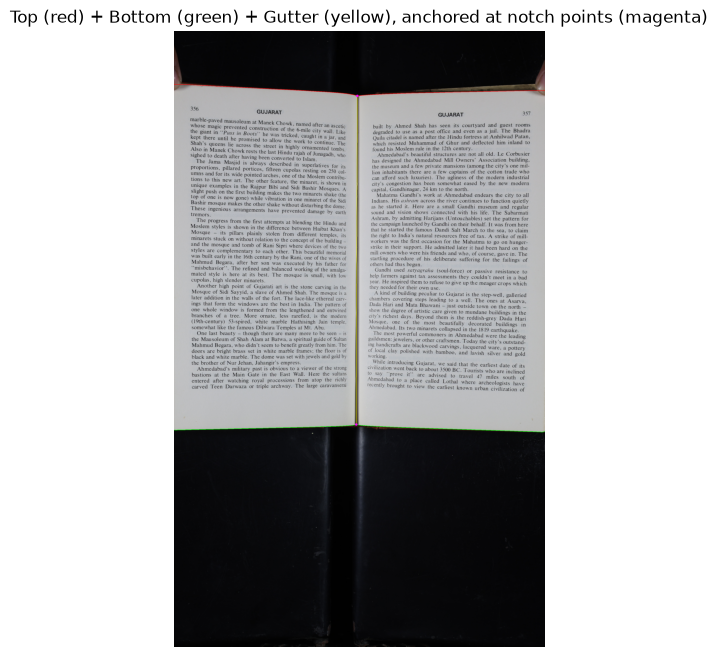

In [115]:
# Cell 5A: Gutter as two anchor points, not a per-row search.
#
# The per-row Gx search (previous attempt) wandered by ~200px chasing local
# text/shadow contrast near the spine instead of the one true crease -- the
# gutter isn't a strong continuous edge to trace at all. But top_edge_final
# and bottom_edge ALREADY show a clear V-notch right at the spine (visible
# in every overlay so far: both curves dip toward the gutter). Use that
# directly: find the notch point in each curve near the seeded gutter x,
# and connect the two points with a smooth line. No new per-row search.

gutter_x_seed = gutter_x_global - left_cut  # shift from ORIGINAL image coords into front_pages crop coords
search_half_width = 150
lo_x = max(0, gutter_x_seed - search_half_width)
hi_x = min(Wf, gutter_x_seed + search_half_width)

# top curve dips DOWN (y increases) toward the gutter -> local max of y
top_notch_x = lo_x + int(np.argmax(top_edge_final[lo_x:hi_x]))
top_notch_y = int(top_edge_final[top_notch_x])

# bottom curve dips UP (y decreases) toward the gutter -> local min of y
bot_notch_x = lo_x + int(np.argmin(bottom_edge[lo_x:hi_x]))
bot_notch_y = int(bottom_edge[bot_notch_x])

print(f"Top notch:    x={top_notch_x}  y={top_notch_y}")
print(f"Bottom notch: x={bot_notch_x}  y={bot_notch_y}")

# connect with a straight line (gutter is only slightly curved -- if this
# isn't curved enough visually, next step is a gentle quadratic bow)
n_pts = bot_notch_y - top_notch_y
gutter_ys = np.arange(top_notch_y, bot_notch_y)
gutter_xs = np.linspace(top_notch_x, bot_notch_x, n_pts).astype(np.int32)

vis = cv2.cvtColor(front_pages, cv2.COLOR_BGR2RGB).copy()
for x in range(Wf):
    ty = top_edge_final[x]
    vis[max(0,ty-1):ty+2, x] = [255, 0, 0]
    by = bottom_edge[x]
    vis[max(0,by-1):by+2, x] = [0, 255, 0]
for gy, gx in zip(gutter_ys, gutter_xs):
    vis[gy, max(0,gx-1):gx+2] = [255, 255, 0]
cv2.circle(vis, (top_notch_x, top_notch_y), 8, (255, 0, 255), -1)
cv2.circle(vis, (bot_notch_x, bot_notch_y), 8, (255, 0, 255), -1)

plt.figure(figsize=(14, 8))
plt.imshow(vis)
plt.title("Top (red) + Bottom (green) + Gutter (yellow), anchored at notch points (magenta)")
plt.axis("off")
plt.show()




Left margin:  1654 ink rows sampled, slope=0.00599 px/row
Right margin: 1654 ink rows sampled, slope=-0.01852 px/row
Left cut x range:  2008 -> 2021  (anchor was 2015)
Right cut x range: 4403 -> 4444  (anchor was 4424)


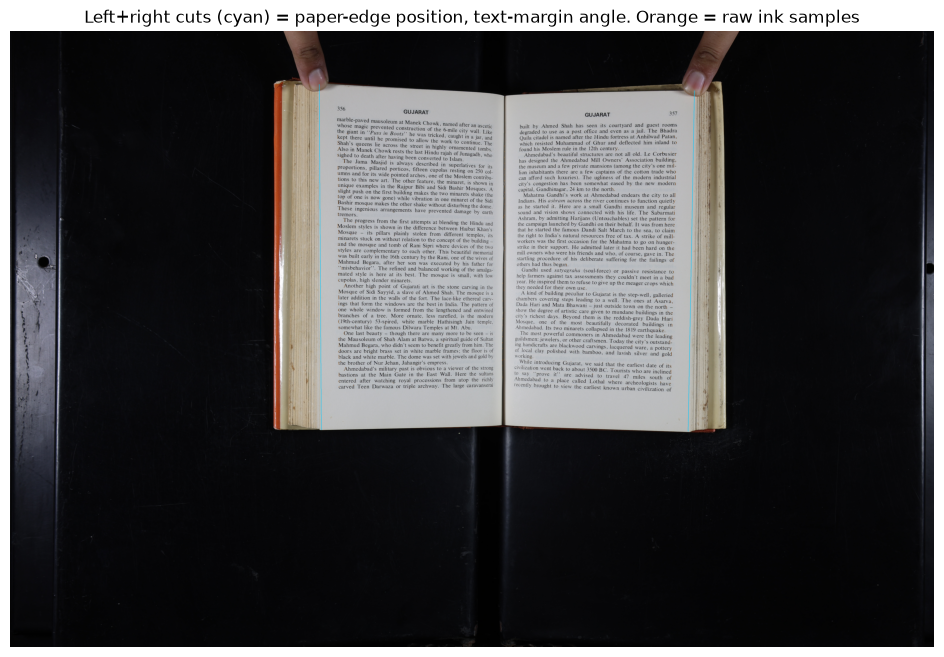

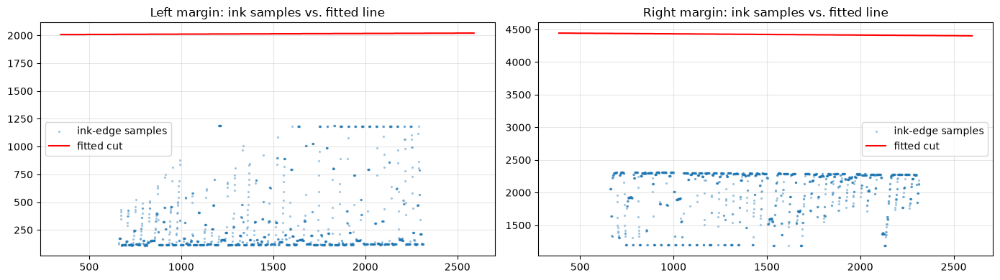

In [124]:
# Cell 6A: Left/right cut = straight line at the paper-edge POSITION
# (left_cut/right_cut, unchanged), but tilted to the ANGLE of the text
# margin instead of forced vertical.
#
# WHY: left_cut/right_cut come from a single Cb color-valley measurement
# (Cell 3D-3F) -- a real signal for WHERE the physical page edge is, but
# averaged over the whole photo height, so it can only ever produce one x
# for the entire image. If the book/camera has ANY rotation, the true
# paper edge is not a vertical line in pixel space, and a constant-x cut
# either clips into the page or leaves a background sliver depending on
# row -- visible in the user's zoomed crops as uneven blank margin between
# the cut and the text block.
#
# The paper edge itself is a weak, low-contrast signal to trace directly
# (that's the whole reason left_cut/right_cut is a single averaged value
# and not a per-row trace). But the PRINTED TEXT MARGIN is a strong,
# high-contrast, and near-universally-present signal, and on a real book
# the text margin is physically parallel to the page edge -- typesetting
# always runs parallel to the trim, not at a random angle to it. So: find
# the text margin's angle (not its position), and apply that angle to the
# already-correct left_cut/right_cut position.
#
# POSITION vs ANGLE split (deliberate):
#   - Position stays anchored to left_cut/right_cut (Cb-valley), evaluated
#     at the vertical midpoint of the page -- that's still the most
#     trustworthy single measurement of where the paper actually is.
#   - Angle comes ONLY from the text margin regression below. Cb-valley
#     was never asked to measure angle (it's a single global average by
#     construction), so borrowing its angle would just be noise.

# --- Find per-line leftmost/rightmost ink columns ---
# Binarize the front-page crop so we can find actual ink pixels (not just
# edge-strength, which respones to any contrast change including page
# texture/shadow). Otsu's threshold adapts per-photo instead of a fixed
# cutoff.
_, ink_mask = cv2.threshold(gray_fp, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Only look at rows safely INSIDE the page (well past the traced top/bottom
# curves) so header/footer noise and the curve trace itself can't leak in.
row_margin = int(0.06 * Hf)
inner_top = int(np.max(top_edge_final)) + row_margin
inner_bot = int(np.min(bottom_edge)) - row_margin

# Left margin: only look at the LEFT half of front_pages (x < gutter), so a
# right-page's ink never pollutes the left-edge measurement, and vice
# versa for the right margin.
gutter_mid_x = (top_notch_x + bot_notch_x) // 2

def per_row_ink_edges(mask, y_lo, y_hi, x_lo, x_hi, side):
    """For each row in [y_lo, y_hi), find the leftmost (side='left') or
    rightmost (side='right') ink column within [x_lo, x_hi). Rows with no
    ink (blank line / paragraph gap) are skipped, not zero-filled --
    those rows carry no margin information at all, and a false x=0 or
    x=Wf-1 would corrupt the regression."""
    rows, xs = [], []
    for y in range(y_lo, y_hi):
        cols = np.where(mask[y, x_lo:x_hi])[0]
        if len(cols) == 0:
            continue
        x = (cols.min() if side == 'left' else cols.max()) + x_lo
        rows.append(y)
        xs.append(x)
    return np.array(rows), np.array(xs)

left_rows, left_xs = per_row_ink_edges(ink_mask, inner_top, inner_bot, 0, gutter_mid_x, 'left')
right_rows, right_xs = per_row_ink_edges(ink_mask, inner_top, inner_bot, gutter_mid_x, Wf, 'right')

# --- Robust line fit through the per-row edge points ---
# Theil-Sen: median of pairwise slopes. Indented lines / drop caps / block
# quotes pull individual rows inward and would badly skew an ordinary
# least-squares fit; Theil-Sen tolerates up to ~29% outlier rows before the
# slope estimate itself is corrupted, which comfortably covers a normal
# paragraph's fraction of indented lines.
from scipy.stats import theilslopes

def robust_angle(rows, xs, min_points=20):
    if len(rows) < min_points:
        return None  # not enough ink rows to trust a slope from this page
    slope, intercept, _, _ = theilslopes(xs, rows)
    return slope, intercept  # x = slope * y + intercept

left_fit = robust_angle(left_rows, left_xs)
right_fit = robust_angle(right_rows, right_xs)

mid_y = (inner_top + inner_bot) // 2

def build_margin_line(fit, anchor_x_global, row_top, row_bot, mid_y_local):
    """Build the final cut line: same slope as the text-margin fit, but
    repositioned so it passes through anchor_x_global (left_cut/right_cut)
    at the page's vertical midpoint -- position from Cb-valley, angle from
    text. If no reliable text-margin slope was found (e.g. an image-only
    page), falls back to the original straight vertical."""
    n = row_bot - row_top
    rows_local = np.arange(n)
    if fit is None:
        return np.full(n, anchor_x_global, dtype=np.int32), 0.0
    slope, _ = fit
    xs = anchor_x_global + slope * (rows_local + row_top - mid_y_local)
    return xs.astype(np.int32), slope

row_top_left = int(top_edge_final[0])
row_bot_left = int(bottom_edge[0])
row_top_right = int(top_edge_final[-1])
row_bot_right = int(bottom_edge[-1])

left_edge_final, left_slope = build_margin_line(left_fit, left_cut, row_top_left, row_bot_left, mid_y)
right_edge_final, right_slope = build_margin_line(right_fit, right_cut, row_top_right, row_bot_right, mid_y)

print(f"Left margin:  {len(left_rows)} ink rows sampled, slope={left_slope:.5f} px/row"
      + ("" if left_fit is not None else "  (fallback: vertical, too few ink rows)"))
print(f"Right margin: {len(right_rows)} ink rows sampled, slope={right_slope:.5f} px/row"
      + ("" if right_fit is not None else "  (fallback: vertical, too few ink rows)"))
print(f"Left cut x range:  {left_edge_final.min()} -> {left_edge_final.max()}  (anchor was {left_cut})")
print(f"Right cut x range: {right_edge_final.min()} -> {right_edge_final.max()}  (anchor was {right_cut})")

# --- Visualize: ink-edge sample points + fitted line, overlaid on image ---
vis = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).copy()
for y, x in zip(left_rows, left_xs):
    vis[y, min(x + left_cut, vis.shape[1]-1)] = [255, 128, 0]  # orange = raw ink-edge samples
for y, x in zip(right_rows, right_xs):
    vis[y, min(x + left_cut, vis.shape[1]-1)] = [255, 128, 0]
for i, y in enumerate(range(row_top_left, row_bot_left)):
    x = left_edge_final[i]
    vis[y, max(0, x - 1):x + 2] = [0, 200, 255]
for i, y in enumerate(range(row_top_right, row_bot_right)):
    x = right_edge_final[i]
    vis[y, max(0, x - 1):x + 2] = [0, 200, 255]

plt.figure(figsize=(14, 8))
plt.imshow(vis)
plt.title("Left+right cuts (cyan) = paper-edge position, text-margin angle. Orange = raw ink samples")
plt.axis("off")
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
axes[0].scatter(left_rows, left_xs, s=2, alpha=0.3, label="ink-edge samples")
axes[0].plot(row_top_left + np.arange(len(left_edge_final)), left_edge_final, color='red', linewidth=1.5, label="fitted cut")
axes[0].set_title("Left margin: ink samples vs. fitted line")
axes[0].legend()
axes[0].grid(alpha=0.3)
axes[1].scatter(right_rows, right_xs, s=2, alpha=0.3, label="ink-edge samples")
axes[1].plot(row_top_right + np.arange(len(right_edge_final)), right_edge_final, color='red', linewidth=1.5, label="fitted cut")
axes[1].set_title("Right margin: ink samples vs. fitted line")
axes[1].legend()
axes[1].grid(alpha=0.3)
plt.tight_layout()
plt.show()


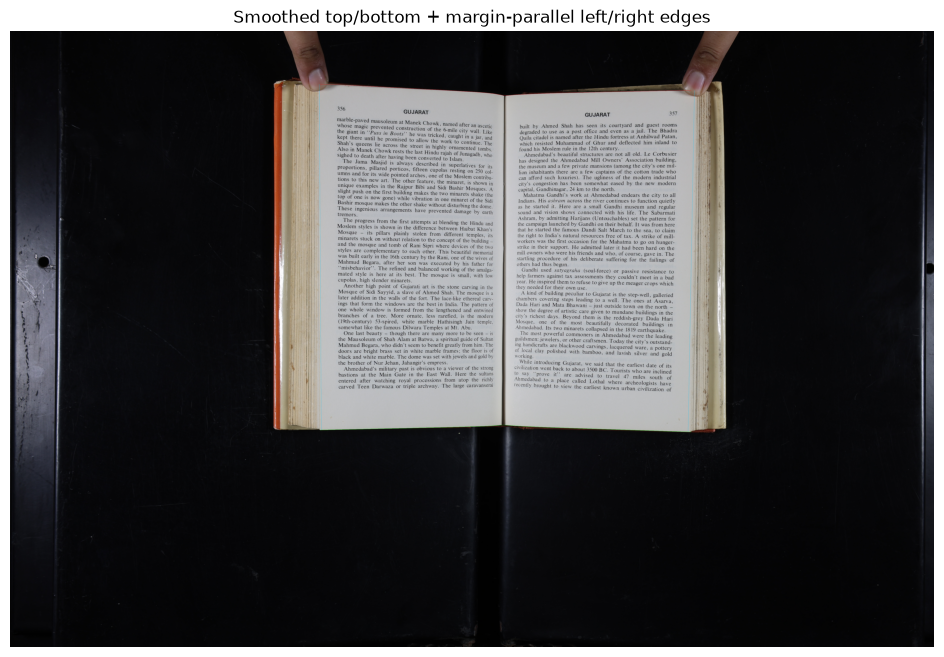

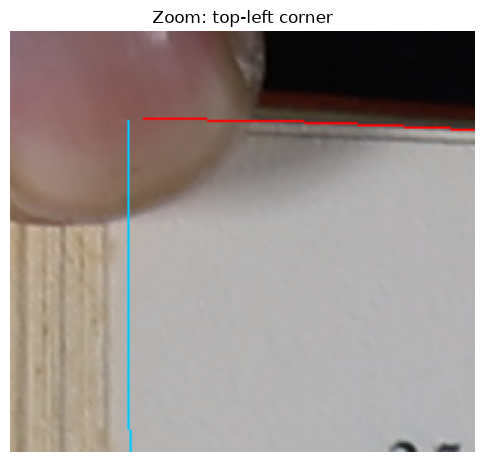

In [125]:
# Cell 6D: Smooth the top/bottom curves (Sav-Gol). Left and right (Cell 6A)
# are already a straight line by construction -- a robust linear fit through
# the text-margin ink samples, repositioned to the Cb-valley anchor -- so
# there's nothing left to smooth; Sav-Gol would only add edge-window noise
# for no benefit.

from scipy.signal import savgol_filter

def smooth(curve, window=151, poly=2):
    w = min(window, len(curve) - (1 - len(curve) % 2))
    if w < poly + 2:
        return curve.astype(np.int32)
    if w % 2 == 0:
        w -= 1
    return savgol_filter(curve.astype(np.float64), w, poly).astype(np.int32)

top_edge_smooth = smooth(top_edge_final)
bot_edge_smooth = smooth(bottom_edge)
left_edge_smooth = left_edge_final
right_edge_smooth = right_edge_final

vis = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).copy()
for x in range(Wf):
    vis[top_edge_smooth[x], x + left_cut] = [255, 0, 0]
    vis[bot_edge_smooth[x], x + left_cut] = [0, 255, 0]
for i, y in enumerate(range(row_top_left, row_bot_left)):
    vis[y, left_edge_smooth[i]] = [0, 200, 255]
for i, y in enumerate(range(row_top_right, row_bot_right)):
    vis[y, right_edge_smooth[i]] = [0, 200, 255]

plt.figure(figsize=(14, 8))
plt.imshow(vis)
plt.title("Smoothed top/bottom + margin-parallel left/right edges")
plt.axis("off")
plt.show()

crop_check = vis[max(0,row_top_left-40):row_top_left+150, max(0,left_cut-60):left_cut+150]
plt.figure(figsize=(6,6))
plt.imshow(crop_check)
plt.title("Zoom: top-left corner")
plt.axis("off")
plt.show()


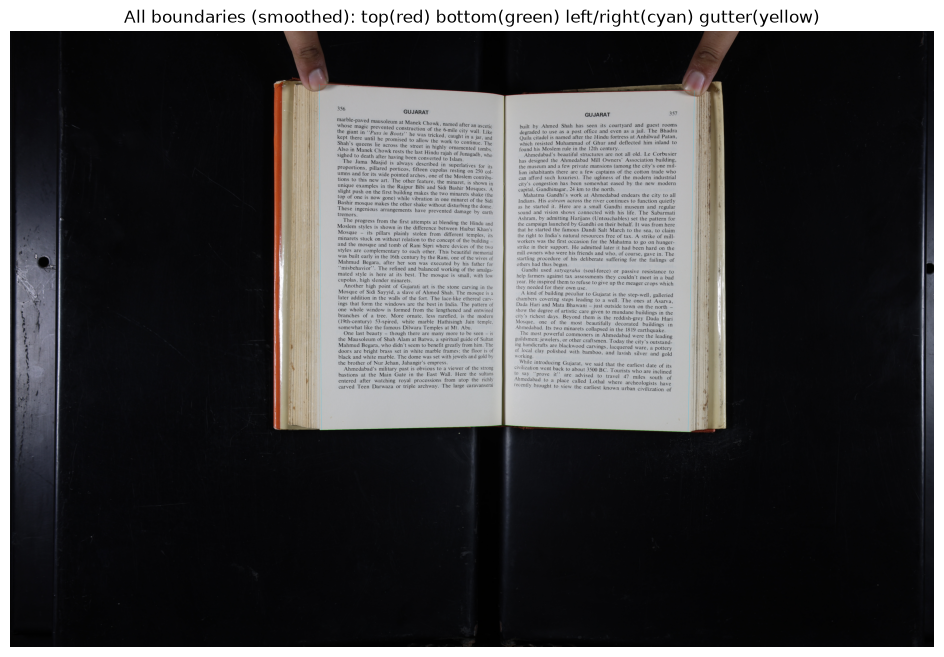

left_page shape: (2247, 1201, 3)
right_page shape: (2218, 1244, 3)


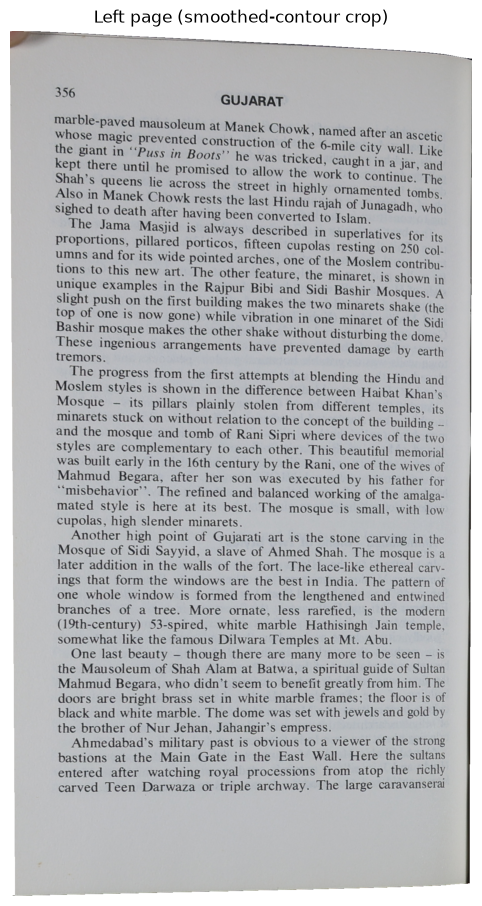

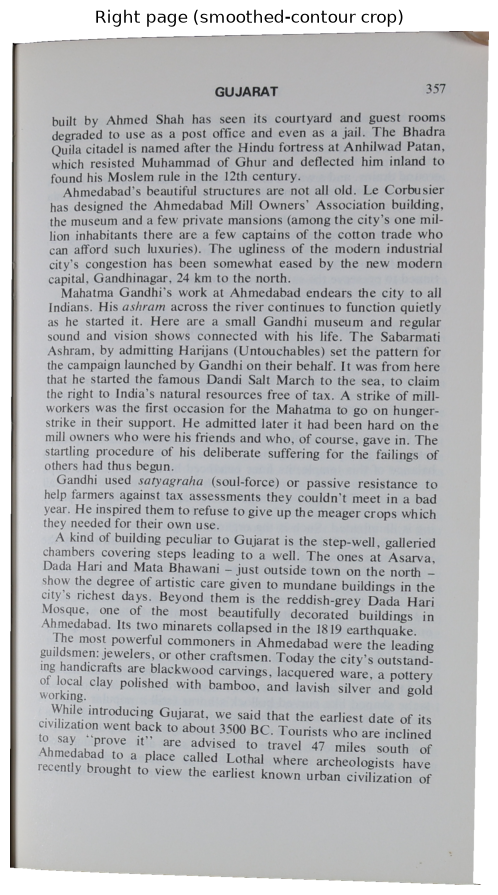

In [126]:
# Cell 7B: Preview all SMOOTHED boundaries, then split into LEFT/RIGHT
# page crops. Uses top_edge_smooth/bot_edge_smooth/left_edge_smooth/
# right_edge_smooth (Sav-Gol smoothed, corners pinned exactly) instead of
# the raw jittery traces -- crop follows a clean smooth line all the way
# into each pinned corner, no gap, no jitter.

gutter_img_xs = gutter_xs + left_cut
gutter_img_ys = gutter_ys

vis = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).copy()
for x in range(Wf):
    vis[top_edge_smooth[x], x + left_cut] = [255, 0, 0]
    vis[bot_edge_smooth[x], x + left_cut] = [0, 255, 0]
for i, y in enumerate(range(row_top_left, row_bot_left)):
    vis[y, left_edge_smooth[i]] = [0, 200, 255]
for i, y in enumerate(range(row_top_right, row_bot_right)):
    vis[y, right_edge_smooth[i]] = [0, 200, 255]
for gy, gx in zip(gutter_img_ys, gutter_img_xs):
    vis[gy, gx] = [255, 255, 0]

plt.figure(figsize=(14, 8))
plt.imshow(vis)
plt.title("All boundaries (smoothed): top(red) bottom(green) left/right(cyan) gutter(yellow)")
plt.axis("off")
plt.show()

# --- LEFT PAGE ---
left_contour = []
for x in range(0, top_notch_x + 1):
    left_contour.append((x + left_cut, int(top_edge_smooth[x])))
for gy, gx in zip(gutter_ys, gutter_xs):
    left_contour.append((gx + left_cut, gy))
for x in range(bot_notch_x, -1, -1):
    left_contour.append((x + left_cut, int(bot_edge_smooth[x])))
for i in range(len(left_edge_smooth) - 1, -1, -1):
    left_contour.append((int(left_edge_smooth[i]), row_top_left + i))

left_contour = np.array(left_contour, dtype=np.int32)
mask_l = np.zeros(img.shape[:2], dtype=np.uint8)
cv2.fillPoly(mask_l, [left_contour], 255)
xl, yl, wl, hl = cv2.boundingRect(left_contour)
left_page = img[yl:yl+hl, xl:xl+wl].copy()
left_page[mask_l[yl:yl+hl, xl:xl+wl] == 0] = 255

# --- RIGHT PAGE ---
right_contour = []
for x in range(top_notch_x, Wf):
    right_contour.append((x + left_cut, int(top_edge_smooth[x])))
for i in range(len(right_edge_smooth)):
    right_contour.append((int(right_edge_smooth[i]), row_top_right + i))
for x in range(Wf - 1, bot_notch_x - 1, -1):
    right_contour.append((x + left_cut, int(bot_edge_smooth[x])))
for gy, gx in zip(reversed(gutter_ys), reversed(gutter_xs)):
    right_contour.append((gx + left_cut, gy))

right_contour = np.array(right_contour, dtype=np.int32)
mask_r = np.zeros(img.shape[:2], dtype=np.uint8)
cv2.fillPoly(mask_r, [right_contour], 255)
xr, yr, wr, hr = cv2.boundingRect(right_contour)
right_page = img[yr:yr+hr, xr:xr+wr].copy()
right_page[mask_r[yr:yr+hr, xr:xr+wr] == 0] = 255

print("left_page shape:", left_page.shape)
print("right_page shape:", right_page.shape)

plt.figure(figsize=(wl/200, hl/200))
plt.imshow(cv2.cvtColor(left_page, cv2.COLOR_BGR2RGB))
plt.title("Left page (smoothed-contour crop)")
plt.axis("off")
plt.show()

plt.figure(figsize=(wr/200, hr/200))
plt.imshow(cv2.cvtColor(right_page, cv2.COLOR_BGR2RGB))
plt.title("Right page (smoothed-contour crop)")
plt.axis("off")
plt.show()



In [127]:
# Cell 8A-0: V-cradle tilt angle -- MANUAL parameter, by design.
#
# We tried to auto-measure this from the photo itself: comparing the
# outer-edge vs gutter curve lengths, the top-edge's local slope at the
# gutter notch, and two different text-based signals (word-gap spacing,
# text-line spacing), pooled and least-squares fit where possible. Across
# five independent methods the results ranged from 0deg to 45deg+ with no
# convergence -- the compression effect we're trying to detect is smaller
# than the natural noise in any of these signals when measured from a
# single 2D photo with no camera calibration or known reference length.
# That's a real finding, not a bug to keep chasing: it means auto-
# detection isn't reliable here without more information (e.g. a
# calibrated camera setup, a known reference object in frame, or multiple
# photos of the same page).
#
# For the real app: this should be a user-facing control, since capture
# rigs vary (flat cradles need ~0deg / no correction at all, V-cradles
# vary by design and by how the book itself sits in them). Plain-language
# framing for that control: "How much does the page curve away from the
# camera near the spine?" with a slider/preset from "Flat" (0deg) to
# "Steep V-cradle" (40deg+), and a live preview (like the 10/19/30/40deg
# comparison we generated here) so the user can visually pick what looks
# right for their own setup -- exactly how we validated 30deg for THIS
# photo, by eye, against the flattened result.

THETA_DEG = 30  # <-- adjust this per photo/rig; see comment above for why it's manual



LEFT page  -> out_w=1399 (raw 1211.2 x 1.1547)  out_h=2249
RIGHT page -> out_w=1426 (raw 1234.9 x 1.1547)  out_h=2229


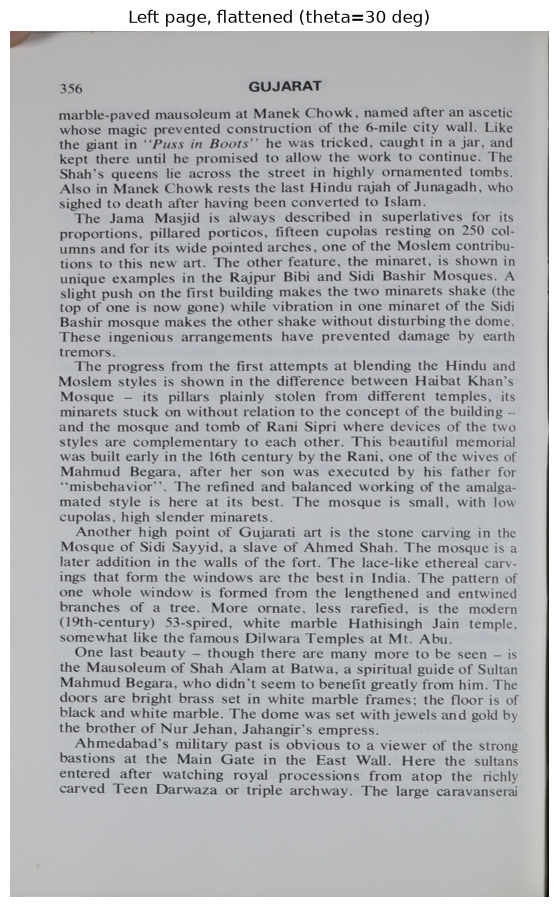

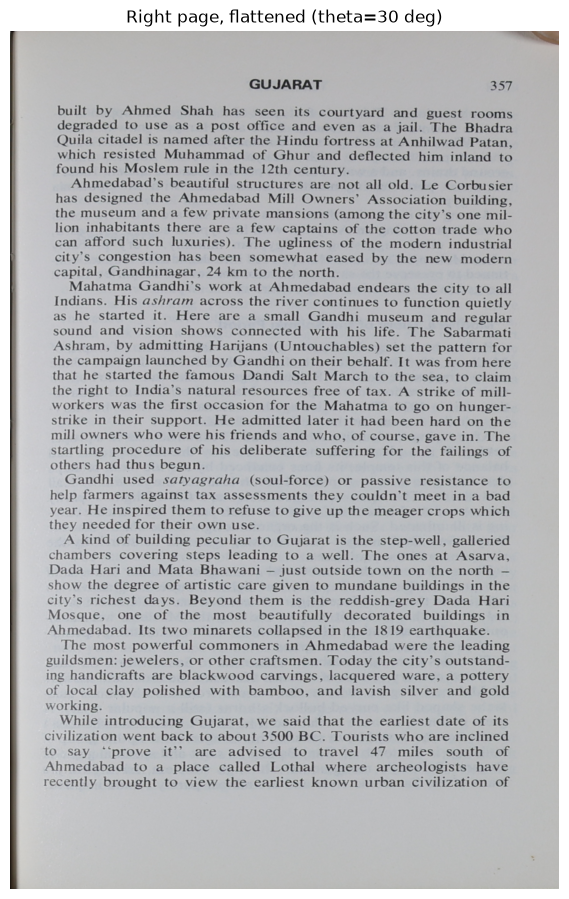

In [128]:
# Cell 8B: Flatten each page with a single 4-corner perspective warp.
#
# HEIGHT: the outer edge's own traced arc length (least-foreshortened,
# closest to true physical length).
#
# WIDTH: scaled up from the raw photographed top/bottom segment average by
# 1/cos(THETA_DEG) -- THETA_DEG is set as a manual parameter in the cell
# above (see that cell for why it isn't auto-measured).
#
# CORNER FIX (post Cell 6A): left/right are now a tilted line (paper-edge
# position, text-margin angle), not a constant x. The outer-edge corners
# must be read from left_edge_smooth[0]/[-1] and right_edge_smooth[0]/[-1]
# -- using the flat left_cut/right_cut seed here would silently discard
# the tilt Cell 6A just fit and pin the crop back to the old wrong
# constant-x corner.

WIDTH_SCALE = 1 / np.cos(np.radians(THETA_DEG))

def curve_length(xs, ys):
    return float(np.sum(np.hypot(np.diff(xs), np.diff(ys))))

def perspective_correct(page_img, corners_src, out_w, out_h):
    src = np.array(corners_src, dtype=np.float32)
    dst = np.array([[0, 0], [out_w, 0], [out_w, out_h], [0, out_h]], dtype=np.float32)
    M = cv2.getPerspectiveTransform(src, dst)
    return cv2.warpPerspective(page_img, M, (out_w, out_h), borderValue=(255, 255, 255))

# --- LEFT PAGE ---
left_TL = (int(left_edge_smooth[0]), int(top_edge_smooth[0]))
left_TR = (gutter_xs[0] + left_cut, int(gutter_ys[0]))     # gutter top
left_BR = (gutter_xs[-1] + left_cut, int(gutter_ys[-1]))   # gutter bottom
left_BL = (int(left_edge_smooth[-1]), int(bot_edge_smooth[0]))

outer_edge_len_left = curve_length(left_edge_smooth, np.arange(row_top_left, row_bot_left))
left_out_h = int(round(outer_edge_len_left))

top_seg_len_left = curve_length(np.arange(0, top_notch_x + 1) + left_cut, top_edge_smooth[:top_notch_x + 1])
bot_seg_len_left = curve_length(np.arange(0, bot_notch_x + 1) + left_cut, bot_edge_smooth[:bot_notch_x + 1])
raw_w_left = (top_seg_len_left + bot_seg_len_left) / 2
left_out_w = int(round(raw_w_left * WIDTH_SCALE))

print(f"LEFT page  -> out_w={left_out_w} (raw {raw_w_left:.1f} x {WIDTH_SCALE:.4f})  out_h={left_out_h}")

left_flat = perspective_correct(img, [left_TL, left_TR, left_BR, left_BL], left_out_w, left_out_h)

# --- RIGHT PAGE ---
right_TL = (gutter_xs[0] + left_cut, int(gutter_ys[0]))
right_TR = (int(right_edge_smooth[0]), int(top_edge_smooth[-1]))
right_BR = (int(right_edge_smooth[-1]), int(bot_edge_smooth[-1]))
right_BL = (gutter_xs[-1] + left_cut, int(gutter_ys[-1]))

outer_edge_len_right = curve_length(right_edge_smooth, np.arange(row_top_right, row_bot_right))
right_out_h = int(round(outer_edge_len_right))

top_seg_len_right = curve_length(np.arange(top_notch_x, Wf) + left_cut, top_edge_smooth[top_notch_x:])
bot_seg_len_right = curve_length(np.arange(bot_notch_x, Wf) + left_cut, bot_edge_smooth[bot_notch_x:])
raw_w_right = (top_seg_len_right + bot_seg_len_right) / 2
right_out_w = int(round(raw_w_right * WIDTH_SCALE))

print(f"RIGHT page -> out_w={right_out_w} (raw {raw_w_right:.1f} x {WIDTH_SCALE:.4f})  out_h={right_out_h}")

right_flat = perspective_correct(img, [right_TL, right_TR, right_BR, right_BL], right_out_w, right_out_h)

plt.figure(figsize=(left_out_w/200, left_out_h/200))
plt.imshow(cv2.cvtColor(left_flat, cv2.COLOR_BGR2RGB))
plt.title(f"Left page, flattened (theta={THETA_DEG} deg)")
plt.axis("off")
plt.show()

plt.figure(figsize=(right_out_w/200, right_out_h/200))
plt.imshow(cv2.cvtColor(right_flat, cv2.COLOR_BGR2RGB))
plt.title(f"Right page, flattened (theta={THETA_DEG} deg)")
plt.axis("off")
plt.show()


In [129]:
# Cell 9A: Shared helpers for the curvature+width-aware dewarp below
# (Cell 9B). Cell 8B's single 4-corner homography conflated two different
# corrections into one manual angle (THETA_DEG). These helpers keep them
# explicit and separate:
#
#   1. CURVE STRAIGHTENING: per-column, map source rows linearly between
#      the traced top and bottom curves at that column -- removes the
#      bow directly from the measured curve shape.
#
#   2. WIDTH (perspective) CORRECTION: per-column horizontal stretch, so
#      the output recovers the true physical page width rather than the
#      apparent (foreshortened) pixel span.
#
# Two width-correction approaches were tried before this one:
#   - A single circular-arc radius fit to h(x)=bottom(x)-top(x) via
#     closed-form least squares: dropped, wildly unstable (R came back
#     27580px/34073px on a ~1700px page -- divides by a near-zero
#     denominator whenever the curvature signal is weak).
#   - Integrating H0/h(x) directly (H0 = height at the single outer-edge
#     column): dropped after checking it against real data -- it
#     violates a hard physical invariant. A page that only bends can
#     never end up NARROWER after correction than its raw apparent
#     width (bending only adds length, never removes it), but this
#     method produced out_w=1661 against a raw apparent width of
#     1708/1686 on the real test photo. Root cause: H0 was read from a
#     SINGLE pixel column at the noisy edge of the traced/smoothed
#     array, so if more columns ended up with h(x) slightly ABOVE that
#     one noisy sample than below it, the average stretch factor drops
#     under 1.0 and the whole integral shrinks instead of growing.
#
# CURRENT method: literal arc length of the traced top/bottom curves,
# averaged. This can't shrink below the raw pixel span by construction
# -- each per-column step is hypot(1, dy), which is mathematically
# always >= 1 (the straight-line step), so the cumulative sum is
# guaranteed >= the raw column count no matter how noisy the tracing is.
#
# OUTER-EDGE TILT FIX: the original version of this function sampled
# every output row of a given output column from the SAME source column
# (src_col constant down the column, only top_y/bot_y varied per column).
# That's only correct if the outer page edge is a vertical line in the
# photo. Since Cell 6A made left_edge_smooth/right_edge_smooth a TILTED
# line (paper-edge position, text-margin angle), the source column at the
# outer-edge boundary now genuinely depends on ROW, not just on which
# output column we're at -- confirmed as the actual bug behind the
# visible widening gap in the flattened output (Cell 6A's own crop in
# Cell 7B was already correct; this function just wasn't using its
# output). Fix: take the row-indexed outer-edge array (outer_x_at_row,
# ALWAYS the true outer edge for whichever page is being processed --
# left_edge_smooth for the left page, right_edge_smooth for the right
# page) and the row-indexed gutter x (gutter_x_at_row, same row range),
# and blend them per output pixel using the SAME fractional column
# position already used for the top/bottom row blend -- so "column 0" of
# the output genuinely tracks the tilted outer edge at whatever row it's
# sampling, instead of a single fixed source column.

def remap_curved_page(img_full, local_cols, top_y, bot_y, physical_x,
                       outer_x_at_row, gutter_x_at_row, row_top,
                       out_w, out_h):
    """
    local_cols, top_y, bot_y, physical_x: parallel 1D arrays, ALL ordered
        starting at the page's OUTER edge (index 0) and ending at the
        GUTTER (index -1) -- ascending column order for the left page,
        descending for the right page. physical_x must be increasing.
    outer_x_at_row: 1D array, the TRUE outer edge for this page in
        ORIGINAL image column coordinates, indexed by (row - row_top)
        -- left_edge_smooth for the left page, right_edge_smooth for the
        right page. Always "outer edge", regardless of which page.
    gutter_x_at_row: 1D array, the gutter's x in ORIGINAL image column
        coordinates, over the SAME row range as outer_x_at_row (i.e.
        gutter_xs + left_cut, reindexed/clamped to [row_top, row_top+out_h)).
    row_top: the image row that index 0 of outer_x_at_row/gutter_x_at_row
        corresponds to (row_top_left or row_top_right).
    Returns the flattened page: output column 0 = outer edge, column
    out_w-1 = gutter (caller flips horizontally for the right page to
    restore correct gutter-left/outer-right physical orientation).
    """
    idx = np.arange(len(local_cols), dtype=np.float64)

    out_pos = np.arange(out_w, dtype=np.float64)
    frac_idx = np.interp(out_pos, physical_x, idx)  # length out_w, range [0, len(idx)-1]
    frac_01 = frac_idx / max(idx[-1], 1e-9)          # 0 = outer edge, 1 = gutter

    top_at = np.interp(frac_idx, idx, top_y)
    bot_at = np.interp(frac_idx, idx, bot_y)

    t = (np.arange(out_h, dtype=np.float64) / max(out_h - 1, 1))[:, None]
    map_y = (top_at[None, :] + t * (bot_at[None, :] - top_at[None, :])).astype(np.float32)

    # Per-row outer/gutter x, looked up at each output row's OWN mapped
    # source row (map_y varies by output row AND output column, so this
    # lookup must too -- a single row_top-relative index isn't enough
    # once curve-straightening has already re-sampled the rows).
    n_row_samples = len(outer_x_at_row)
    row_lookup_idx = np.clip(map_y - row_top, 0, n_row_samples - 1)
    outer_x = np.interp(row_lookup_idx.ravel(), np.arange(n_row_samples), outer_x_at_row).reshape(map_y.shape)
    gutter_x = np.interp(row_lookup_idx.ravel(), np.arange(n_row_samples), gutter_x_at_row).reshape(map_y.shape)

    frac_01_2d = np.broadcast_to(frac_01[None, :], map_y.shape)
    map_x = (outer_x + frac_01_2d * (gutter_x - outer_x)).astype(np.float32)

    return cv2.remap(
        img_full, map_x, map_y, interpolation=cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_CONSTANT, borderValue=(255, 255, 255),
    )


[Arc-length] LEFT  out_w=1208  out_h=2245
[Arc-length] RIGHT out_w=1231  out_h=2213


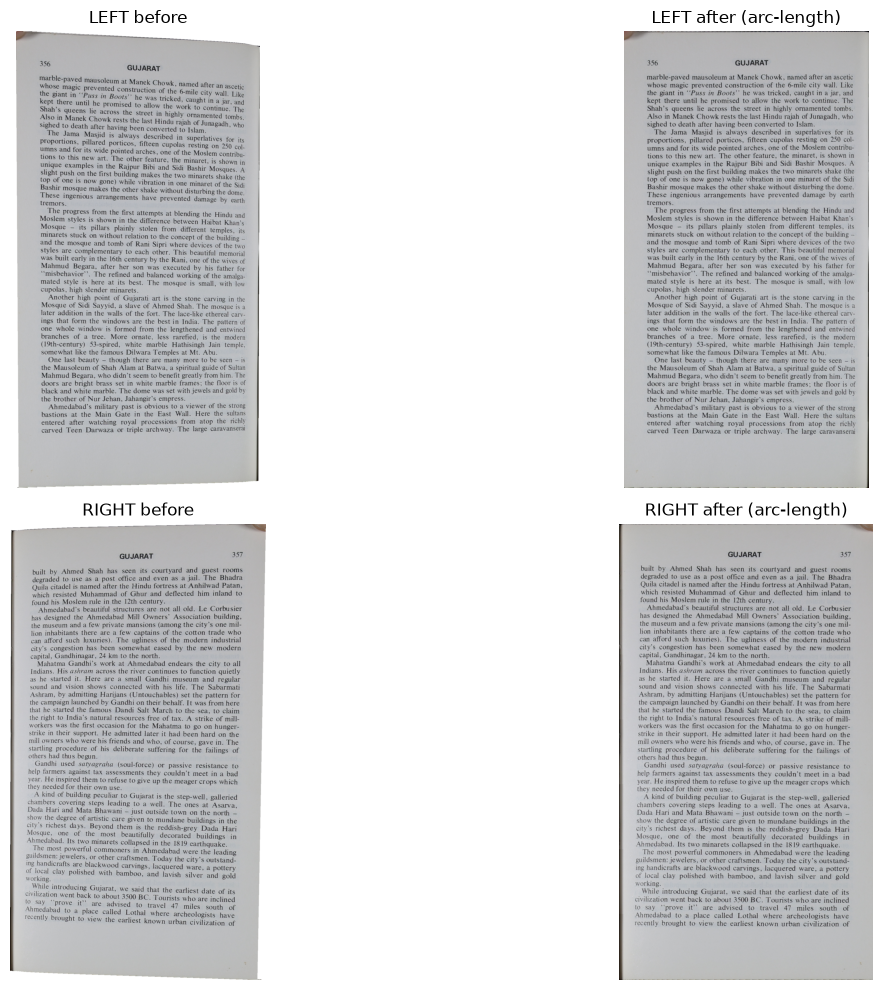

In [130]:
# Cell 9B: Method 1 -- boundary curve arc-length dewarp.
#
# WIDTH: per-column cumulative arc length, averaged between the traced
# top and bottom curves (their own physical bow/wiggle as they run from
# outer edge to gutter). Guaranteed >= the raw pixel span by
# construction -- see Cell 9A for why the earlier H0/h(x) approach
# didn't have that guarantee and failed on the real photo.
# CURVE STRAIGHTENING: same as before, per-column linear row remap
# between the top and bottom curves (Cell 9A's remap_curved_page).
#
# OUTER-EDGE TILT FIX: build outer_x_at_row (left_edge_smooth /
# right_edge_smooth, already row-indexed) and gutter_x_at_row (the
# gutter's x, reindexed to the SAME row range) and pass both through to
# remap_curved_page -- see Cell 9A for why this was missing before and
# caused the widening gap in the flattened output.

WIDTH_GAIN_ARC = 1.0  # manual override: >1 stretches width correction harder, <1 softer

def arc_length_physical_x(top_y, bot_y, width_gain=1.0):
    dy_top = np.diff(top_y)
    dy_bot = np.diff(bot_y)
    ds = (np.hypot(1.0, dy_top) + np.hypot(1.0, dy_bot)) / 2.0 * width_gain
    return np.concatenate([[0.0], np.cumsum(ds)])

def gutter_x_over_rows(row_top, row_bot):
    """Reindex the gutter's (gutter_ys, gutter_xs) -- which only spans
    [top_notch_y, bot_notch_y) -- onto the FULL [row_top, row_bot) range
    a page's outer edge covers. Rows outside the gutter's own span are
    clamped to its nearest endpoint x (the gutter notch is always inside
    the page's row range, never wider than it, so this only ever extends
    a already-near-straight segment, not extrapolates something curved)."""
    rows = np.arange(row_top, row_bot)
    return np.interp(rows, gutter_ys, gutter_xs + left_cut,
                      left=gutter_xs[0] + left_cut, right=gutter_xs[-1] + left_cut)

# --- LEFT PAGE (outer edge at local x=0, already ascending) ---
lo, hi = 0, min(top_notch_x, bot_notch_x)
local_cols_l = np.arange(lo, hi + 1)
top_y_l = top_edge_smooth[lo:hi + 1].astype(np.float64)
bot_y_l = bot_edge_smooth[lo:hi + 1].astype(np.float64)
phys_x_l = arc_length_physical_x(top_y_l, bot_y_l, WIDTH_GAIN_ARC)
out_w_l = max(1, int(round(phys_x_l[-1])))
out_h_l = row_bot_left - row_top_left

left_flat_data = remap_curved_page(
    img, local_cols_l, top_y_l, bot_y_l, phys_x_l,
    left_edge_smooth, gutter_x_over_rows(row_top_left, row_bot_left), row_top_left,
    out_w_l, out_h_l,
)

# --- RIGHT PAGE (outer edge at local x=Wf-1: build descending so index 0 = outer edge) ---
lo, hi = max(top_notch_x, bot_notch_x), Wf - 1
local_cols_r = np.arange(hi, lo - 1, -1)
top_y_r = top_edge_smooth[local_cols_r].astype(np.float64)
bot_y_r = bot_edge_smooth[local_cols_r].astype(np.float64)
phys_x_r = arc_length_physical_x(top_y_r, bot_y_r, WIDTH_GAIN_ARC)
out_w_r = max(1, int(round(phys_x_r[-1])))
out_h_r = row_bot_right - row_top_right

right_flat_data = remap_curved_page(
    img, local_cols_r, top_y_r, bot_y_r, phys_x_r,
    right_edge_smooth, gutter_x_over_rows(row_top_right, row_bot_right), row_top_right,
    out_w_r, out_h_r,
)
right_flat_data = cv2.flip(right_flat_data, 1)  # restore gutter-left/outer-right orientation

print(f"[Arc-length] LEFT  out_w={out_w_l}  out_h={out_h_l}")
print(f"[Arc-length] RIGHT out_w={out_w_r}  out_h={out_h_r}")

fig, axes = plt.subplots(2, 2, figsize=(16, 10))
axes[0,0].imshow(cv2.cvtColor(left_page, cv2.COLOR_BGR2RGB)); axes[0,0].set_title("LEFT before"); axes[0,0].axis("off")
axes[0,1].imshow(cv2.cvtColor(left_flat_data, cv2.COLOR_BGR2RGB)); axes[0,1].set_title("LEFT after (arc-length)"); axes[0,1].axis("off")
axes[1,0].imshow(cv2.cvtColor(right_page, cv2.COLOR_BGR2RGB)); axes[1,0].set_title("RIGHT before"); axes[1,0].axis("off")
axes[1,1].imshow(cv2.cvtColor(right_flat_data, cv2.COLOR_BGR2RGB)); axes[1,1].set_title("RIGHT after (arc-length)"); axes[1,1].axis("off")
plt.tight_layout()
plt.show()


LEFT  page width -- before: 1201px   after: 1208px   change: +7px (+0.58%)
RIGHT page width -- before: 1244px   after: 1231px   change: -13px (-1.05%)


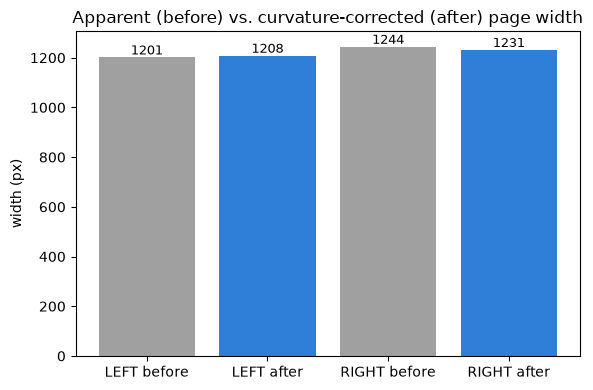

In [123]:
# Cell 9C: Compare page width BEFORE (still-curved bounding-box crop,
# left_page/right_page from Cell 7B) vs. AFTER (data-driven dewarp,
# Cell 9B) -- checking directly on this photo that the width correction
# is actually recovering more physical width than the raw apparent
# (straight-line) pixel span, per the curved-page reasoning discussed.

before_w_left = left_page.shape[1]
before_w_right = right_page.shape[1]
after_w_left = left_flat_data.shape[1]
after_w_right = right_flat_data.shape[1]

for name, before, after in [
    ("LEFT", before_w_left, after_w_left),
    ("RIGHT", before_w_right, after_w_right),
]:
    pct = 100 * (after - before) / before
    print(f"{name:5s} page width -- before: {before}px   after: {after}px   change: {after-before:+d}px ({pct:+.2f}%)")

fig, ax = plt.subplots(figsize=(6, 4))
labels = ["LEFT before", "LEFT after", "RIGHT before", "RIGHT after"]
values = [before_w_left, after_w_left, before_w_right, after_w_right]
colors = ["#a0a0a0", "#2f7ed8", "#a0a0a0", "#2f7ed8"]
bars = ax.bar(labels, values, color=colors)
ax.set_ylabel("width (px)")
ax.set_title("Apparent (before) vs. curvature-corrected (after) page width")
for b, v in zip(bars, values):
    ax.text(b.get_x() + b.get_width()/2, v, str(v), ha="center", va="bottom", fontsize=9)
plt.tight_layout()
plt.show()
